# SCICoNE on 10X Genomics data
In this notebook we apply SCICoNE to the 10X Genomics data set from section E of a frozen breast tumor tissue from a triple negative ductal carcinoma with an estimated tumor purity of 75%, which is available [here](https://support.10xgenomics.com/single-cell-dna/datasets/1.1.0/breast_tissue_A_2k). The raw data contain 2053 cells and 154794 genomic bins. To reduce the runtime, here we will use 200 cells to identify breakpoints and learn a tree on clustered data. We showcase the possibility of changing the root state to model whole-genome duplications.

First we download the data.

In [1]:
#!wget http://cf.10xgenomics.com/samples/cell-dna/1.1.0/breast_tissue_E_2k/breast_tissue_E_2k_cnv_data.h5

Import `scicone` and create the SCICoNE object.

In [2]:
import scicone
import numpy as np
import pickle
import subprocess

install_path = '/cluster/work/bewi/members/pedrof/tupro_code/SCICoNE/build2024/'
temporary_outpath = './'
seed = 42 # for reproducibility

np.random.seed(seed)

# Create SCICoNE object
sci = scicone.SCICoNE(install_path, temporary_outpath, verbose=False)

Using binaries at /cluster/work/bewi/members/pedrof/tupro_code/SCICoNE/build2024/


SCICoNE's API is prepared to handle the format from the standard `cnv_data.h5` file produced by the 10X Genomics CNV pipeline. We use the function `read_10x` to extract the GC bias-corrected read counts, the unmappable bins and the chromosome stop bins to build the cells by bins matrix required by SCICoNE. We use CellRanger's outlier detection to remove noisy cells.

In [3]:
sci.read_10x('../10X_genomics/breast_tissue_E_2k_cnv_data.h5')

Let's normalize the cells by their total read counts and plot the data.

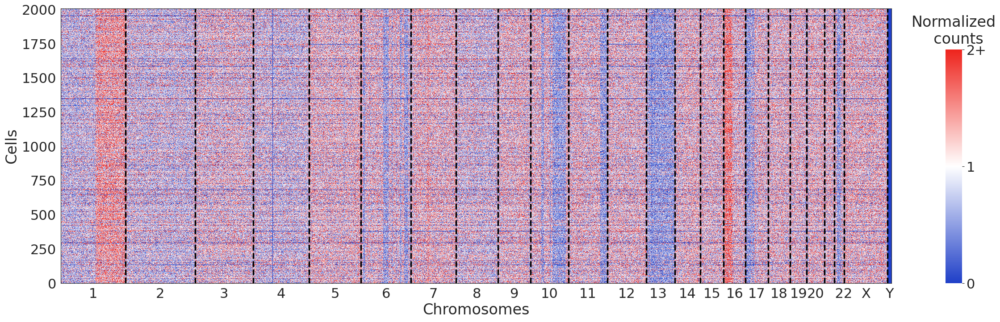

In [4]:
normalized_counts = sci.data['filtered_counts'] / np.sum(np.abs(sci.data['filtered_counts']), axis=1).reshape(-1, 1)
normalized_counts *= normalized_counts.shape[1]

scicone.plotting.plot_matrix(normalized_counts, cbar_title='Normalized\n  counts',
                            chr_stops_dict=sci.data['filtered_chromosome_stops'], vmax=2,
                            cluster=False) # don't cluster the cells for this plot, just to make it faster

The first step is to find the breakpoints that define copy number regions. We pass the chromosome coordinates as known regions.

In [5]:
# import pandas as pd
# gene_coordinates = pd.read_csv('~/gene_coordinates.csv', index_col=0)
# # Take cells randomly
# n_cells = sci.data['filtered_counts'].shape[0]
# np.random.seed(seed)
# cell_subset = np.random.choice(n_cells, size=200, replace=False)
# bps = sci.detect_breakpoints(data=sci.data['filtered_counts'][cell_subset], verbosity=1,
#                             input_breakpoints=list(sci.data['filtered_chromosome_stops'].values()),
#                             window_size=100, gene_coordinates=gene_coordinates)

# np.savetxt('segmented_regions2024.csv', bps['segmented_regions'], delimiter=',')
# np.savetxt('segmented_region_sizes2024.csv', bps['segmented_region_sizes'], delimiter=',')

# import json
# with open("region_gene_map2024.json", "w") as f:
#     json.dump(sci.region_gene_map, f)

# chr_neutral_states = dict(zip(sci.data['filtered_chromosome_stops'].keys(), 
#                          [2] * len(sci.data['filtered_chromosome_stops'].keys())))
# chr_neutral_states['Y'] = 0

# region_neutral_states = scicone.utils.set_region_neutral_states(sci.bps['segmented_regions'], 
#                                                                  list(sci.data['filtered_chromosome_stops'].values()), 
#                                                                  list(chr_neutral_states.values()))
# np.savetxt('region_neutral_states2024.csv', region_neutral_states, delimiter=',')
# with open("sci_after_bp_2024.pickle", "wb") as f:
#     pickle.dump(sci, f)

The breakpoint detection on data with so many bins can take a while, so we will load the breakpoint detection results from a previous run.

In [6]:
sci.bps['segmented_regions'] = np.loadtxt('segmented_regions2024.csv', delimiter=',')
sci.bps['segmented_region_sizes'] = np.loadtxt('segmented_region_sizes2024.csv', delimiter=',')

import json
with open("region_gene_map2024.json", "r") as f:
    sci.region_gene_map = json.load(f)

region_neutral_states = np.loadtxt('region_neutral_states2024.csv', delimiter=',')

d = dict()
for k in sci.region_gene_map:
    d[int(k)] = sci.region_gene_map[k]
sci.region_gene_map = d

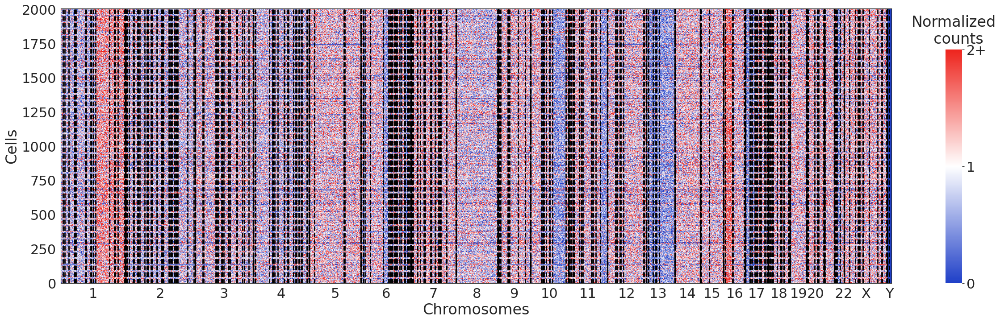

In [7]:
scicone.plotting.plot_matrix(normalized_counts, bps=sci.bps['segmented_regions'],
                             chr_stops_dict=sci.data['filtered_chromosome_stops'],
                             cbar_title='Normalized\n  counts', vmax=2, cluster=False)

Instead of assuming the copy number neutral state is 2 for all chromosomes, we will use the `region_neutral_states` argument of `learn_trees` to adjust the root of the copy number aberration tree. In this case the patient is a female, so we set all chromosomes to have 2 as neutral except chromosome Y, which has 0 copies.

We are now ready to jointly call copy number states and reconstruct the event history tree.

In [8]:
# diploid_tree = sci.learn_tree(region_neutral_states=region_neutral_states, 
#                               cluster_tree_n_iters=40000,
#                               cluster=True, full=False, n_reps=10, max_tries=1,
#                               copy_number_limit=4, seed=seed)
# with open("sci_after_diploid_2024.pickle", "wb") as f:
#     pickle.dump(sci, f)

In [9]:
# Load frozen object for paper reproducibility
with open("sci_after_diploid_2024.pickle", "rb") as f:
    sci = pickle.load(f)
diploid_tree = sci.best_cluster_tree

The `plot_tree` function can be used to visualize the reconstructed tree. By default, the node labels indicate the affected regions. Setting `gene_labels=True` shows the affected genes from COSMIC's Cancer Gene Census instead (which can be filtered by using the `tumor_type` argument), and adds the total number of regions amplified and deleted at each node. The number of cells attached to the node can also be shown.

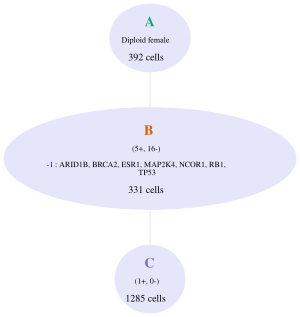

In [10]:
diploid_tree.plot_tree(gene_labels=True, tumor_type='breast', root_label='Diploid female',
                       node_labels=True, node_sizes=True, event_fontsize=8, nodesize_fontsize=10,)

In [11]:
# with open('diploid_tree_2024.graphviz', "w") as file:
#     for line in diploid_tree.graphviz_str:
#         file.write(f"{line}\n")

Let's compare the normalized counts with the inferred copy number profiles. To facilitate the visualization, we group cells based on of their copy number states, and cluster the normalized counts of the cells within each clone.

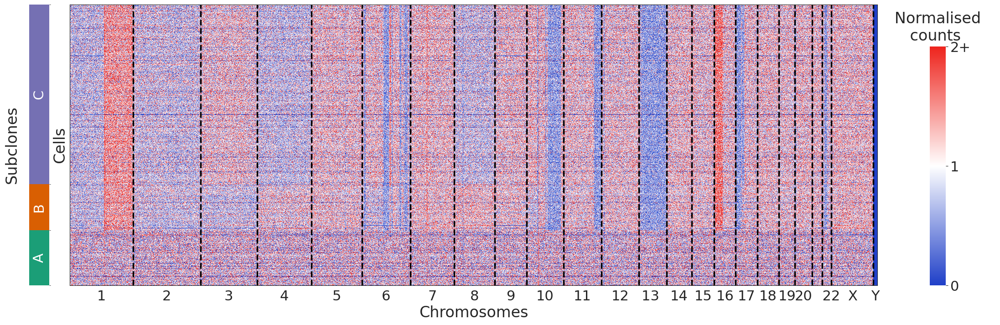

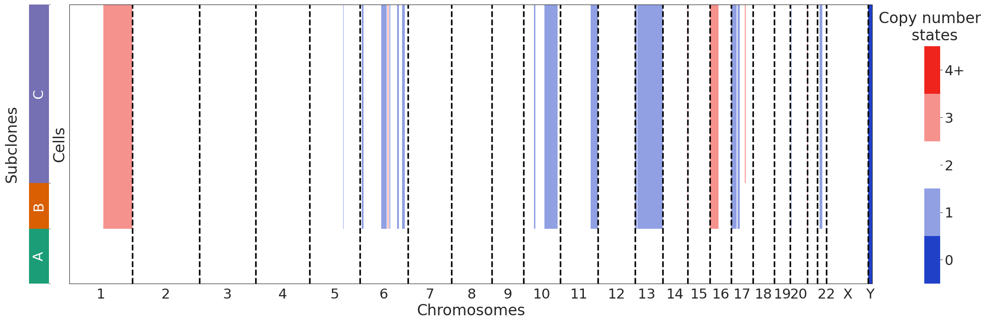

In [12]:
scicone.plotting.plot_matrix(normalized_counts, mode='data', cbar_title='   Normalised   \n    counts     ', vmax=2,
                            chr_stops_dict=sci.data['filtered_chromosome_stops'],
                            labels=diploid_tree.cell_node_labels,
                            # output_path='diploid_tree_normalized_counts_2024.pdf',
                                bbox_to_anchor=(1.065, 0.0, 1, 1), cluster=False)

scicone.plot_matrix(diploid_tree.outputs['inferred_cnvs'], mode='cnv', 
                    cbar_title='  Copy number   \n     states    ', 
                    chr_stops_dict=sci.data['filtered_chromosome_stops'],
                    vmax=4,
                        # output_path='diploid_tree_inferred_cnvs_2024.pdf',
                            labels=diploid_tree.cell_node_labels,
                            bbox_to_anchor=(1.065, 0.0, 1, 1), cluster=False)

Comparing the two figures, it seems that there are events of small magnitude in clones B and C which are not detected by the CNA tree, which assumes a neutral diploid state. Inspecting the library size distribution across clones, it becomes apparent that cells from clone A have a lower library size than the rest of the sample. Tied with the seemingly constant copy number profile of this clone, this indicates that it is likely to correspond to diploid cells, whereas the others have undergone a whole genome duplication.

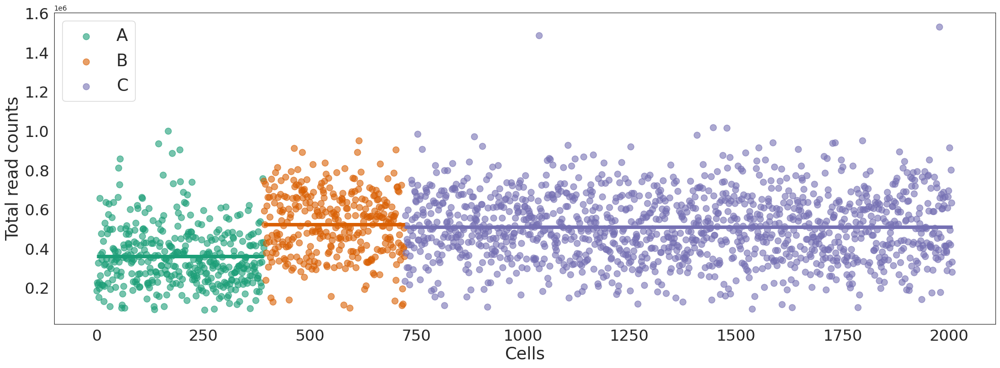

In [13]:
import matplotlib.pyplot as plt

lib_sizes = np.sum(sci.data['filtered_counts'], axis=1).reshape(-1,1)
# Sort cells by clone for visualization
lib_sizes, labels = scicone.utils.cluster_clones(lib_sizes, diploid_tree.cell_node_labels, within_clone=False)

fig = plt.figure(figsize=(24,8), dpi=100)
for i, label in enumerate(np.unique(labels)):
    xx = np.arange(np.where(label==labels)[0][0], np.where(label==labels)[0][-1]+1)
    plt.scatter(xx, lib_sizes[label==labels], label=label, color=scicone.constants.LABEL_COLORS_DICT_NUM[str(i)], 
             s=80, alpha=0.6)
    plt.hlines(np.mean(lib_sizes[label==labels]), xx[0], xx[-1]+1, 
                color=scicone.constants.LABEL_COLORS_DICT_NUM[str(i)], linewidth=5, linestyle='-')
plt.legend(fontsize=24)
plt.ylabel('Total read counts',fontsize=24)
plt.xlabel('Cells',fontsize=24)
ax = plt.gca()
ax.tick_params(which='major', labelsize=22)
ax.tick_params(which='minor', labelsize=22)  
# plt.savefig('diploid_tree_lib_sizes_2024.pdf', bbox_inches='tight')
plt.show()

If we suspect that a large-scale event has occurred in all the cells in the sample, such as a whole-genome duplication, it is beneficial for the tree inference that we start with a tetraploid root. We can then compare the score of the two trees, and choose the best one. If the tetraploid root fits the data better, but we trust that cells in A are diploid, we adjust the tree to capture that with the `adjust_to_wgd` function.

In [14]:
# wgd_tree = sci.learn_tree(region_neutral_states=region_neutral_states*2, # tetraploid root
#                           cluster_tree_n_iters=40000,
#                           cluster=True, full=False, n_reps=10, max_tries=1,
#                           copy_number_limit=4, seed=seed, num_labels=True)
# with open("sci_after_wgd_2024.pickle", "wb") as f:
#     pickle.dump(sci, f)    

In [4]:
# Load frozen object for paper reproducibility
with open("sci_after_wgd_2024.pickle", "rb") as f:
    sci = pickle.load(f)
wgd_tree = sci.best_cluster_tree    

normalized_counts = sci.data['filtered_counts'] / np.sum(np.abs(sci.data['filtered_counts']), axis=1).reshape(-1, 1)
normalized_counts *= normalized_counts.shape[1]

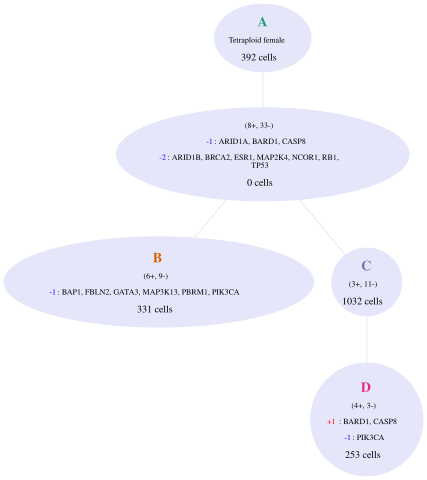

In [5]:
wgd_tree.plot_tree(gene_labels=True, tumor_type='breast',
                   node_labels=True, node_sizes=True, event_fontsize=8, nodesize_fontsize=10,
                  root_label='Tetraploid female')

In [7]:
print(wgd_tree.score > diploid_tree.score)

True


In [8]:
# with open('tetraploid_tree_2024.graphviz', "w") as file:
#     for line in wgd_tree.graphviz_str:
#         file.write(f"{line}\n")

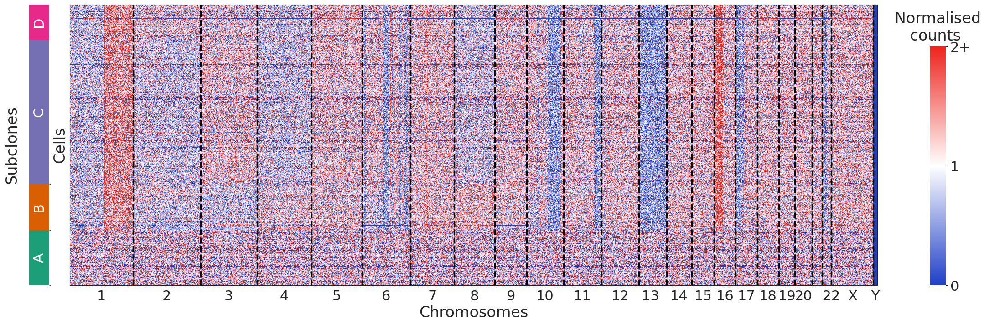

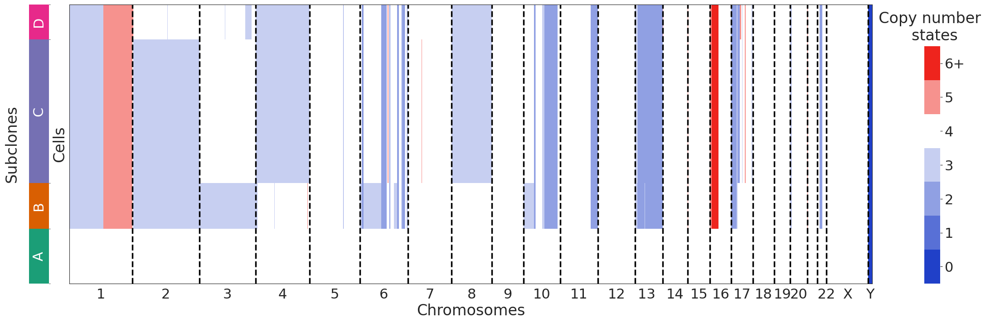

In [10]:
scicone.plotting.plot_matrix(normalized_counts, mode='data', cbar_title='   Normalised   \n    counts     ', vmax=2,
                            chr_stops_dict=sci.data['filtered_chromosome_stops'],
                            labels=wgd_tree.cell_node_labels,
                            # output_path='tetraploid_tree_normalized_counts_2024.pdf',
                            bbox_to_anchor=(1.065, 0.0, 1, 1), cluster=False)

scicone.plotting.plot_matrix(wgd_tree.outputs['inferred_cnvs'], mode='cnv', cbar_title='  Copy number   \n     states    ', 
                             vmax=int(np.max(wgd_tree.outputs['inferred_cnvs'])), vmid=4, 
                            chr_stops_dict=sci.data['filtered_chromosome_stops'],
                            labels=wgd_tree.cell_node_labels,
                            # output_path='tetraploid_tree_inferred_cnvs_mid4_2024.pdf',
                            bbox_to_anchor=(1.065, 0.0, 1, 1), cluster=False)

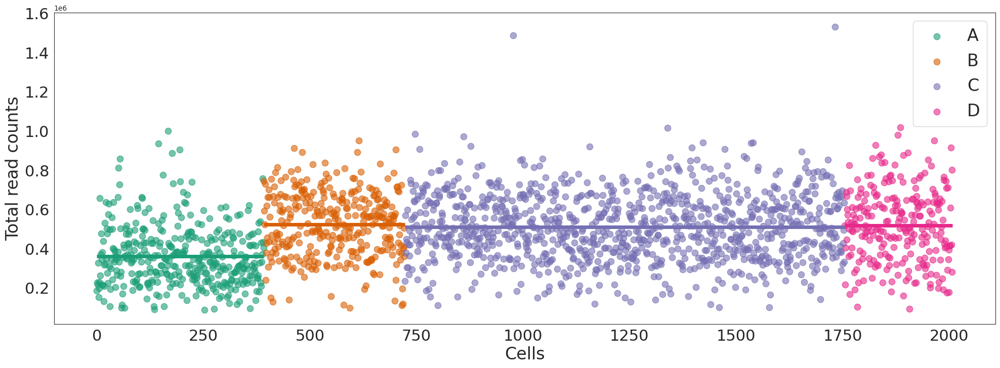

In [12]:
lib_sizes = np.sum(sci.data['filtered_counts'], axis=1).reshape(-1,1)
# Sort cells by clone for visualization
lib_sizes, labels = scicone.utils.cluster_clones(lib_sizes, wgd_tree.cell_node_labels, within_clone=False)

fig = plt.figure(figsize=(24,8), dpi=100)
for i, label in enumerate(np.unique(labels)):
    xx = np.arange(np.where(label==labels)[0][0], np.where(label==labels)[0][-1]+1)
    plt.scatter(xx, lib_sizes[label==labels], label=label, color=scicone.constants.LABEL_COLORS_DICT_NUM[str(i)], 
             s=80, alpha=0.6)
    plt.hlines(np.mean(lib_sizes[label==labels]), xx[0], xx[-1]+1, 
                color=scicone.constants.LABEL_COLORS_DICT_NUM[str(i)], linewidth=5, linestyle='-')
plt.legend(fontsize=24)
plt.ylabel('Total read counts',fontsize=24)
plt.xlabel('Cells',fontsize=24)
ax = plt.gca()
ax.tick_params(which='major', labelsize=22)
ax.tick_params(which='minor', labelsize=22)  
# plt.savefig('wgd_tree_lib_sizes_2024.pdf', bbox_inches='tight')
plt.show()